<a href="https://colab.research.google.com/github/subhrajit77/Palm-Plant-Disease-detection-using-ML-DL/blob/main/palm_150_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# General
import os
import shutil
import random
import numpy as np

# Image processing
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img

# Model building
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# For splitting data
from sklearn.model_selection import train_test_split

In [ ]:

raw_data_path = '/content/drive/MyDrive/Raw Data'

# Processed data folder
processed_data_path = '/content/drive/MyDrive/Final_Data_test_150'

# Folders for train, val, test
train_dir = os.path.join(processed_data_path, 'train')
val_dir = os.path.join(processed_data_path, 'val')
test_dir = os.path.join(processed_data_path, 'test')

# Classes
classes = ['Healthy', 'Stage1', 'Stage2', 'Stage3']

# Create folders
for dir_path in [train_dir, val_dir, test_dir]:
    for class_name in classes:
        os.makedirs(os.path.join(dir_path, class_name), exist_ok=True)


In [ ]:
def split_data(class_folder, train_ratio=0.7, val_ratio=0.1, test_ratio=0.2):
    images = os.listdir(os.path.join(raw_data_path, class_folder))
    random.shuffle(images)

    total_images = len(images)
    train_count = int(total_images * train_ratio)
    val_count = int(total_images * val_ratio)

    train_images = images[:train_count]
    val_images = images[train_count:train_count+val_count]
    test_images = images[train_count+val_count:]

    for image in train_images:
        shutil.copy(os.path.join(raw_data_path, class_folder, image),
                    os.path.join(train_dir, class_folder, image))

    for image in val_images:
        shutil.copy(os.path.join(raw_data_path, class_folder, image),
                    os.path.join(val_dir, class_folder, image))

    for image in test_images:
        shutil.copy(os.path.join(raw_data_path, class_folder, image),
                    os.path.join(test_dir, class_folder, image))

# Apply splitting for all classes
for class_name in classes:
    split_data(class_name)


In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import preprocess_input

# Define paths
base_dir = '/content/drive/MyDrive/Final_Data_test_150'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Image settings
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

# Simple preprocessing without augmentation
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Generators
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    val_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = datagen.flow_from_directory(
    test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


Found 1537 images belonging to 4 classes.
Found 215 images belonging to 4 classes.
Found 436 images belonging to 4 classes.


In [ ]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import preprocess_input

# Define paths
base_dir = '/content/drive/MyDrive/Final_Data_test_150'
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Image settings
IMAGE_SIZE = (224, 224)
BATCH_SIZE = 32

# Simple preprocessing without augmentation
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Generators
train_generator = datagen.flow_from_directory(
    train_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    val_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = datagen.flow_from_directory(
    test_dir,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)


Found 1562 images belonging to 4 classes.
Found 215 images belonging to 4 classes.
Found 436 images belonging to 4 classes.


In [ ]:
import os
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img

# Define augmentation generator
augmentor = ImageDataGenerator(
    rotation_range=20,              # rotate up to 20 degrees
    width_shift_range=0.1,           # shift horizontally up to 10%
    height_shift_range=0.1,          # shift vertically up to 10%
    zoom_range=0.2,                  # zoom in/out by 20%
    shear_range=0.1,                 # shear transformation
    horizontal_flip=True,            # horizontal flip
    fill_mode='nearest',             # fill missing pixels after transformation
    brightness_range=[0.7, 1.3],     # vary brightness between 70% (darker) and 130% (brighter)
    channel_shift_range=30.0         # random shift in the RGB color channels to simulate contrast variations
)

# Paths
train_dir = '/content/drive/MyDrive/Final_Data_test_150/train'
classes = ['Healthy', 'Stage1', 'Stage2', 'Stage3']

# Augment training images
def augment_class_images(class_folder, augment_times=3):  # 3 augmented per image
    class_path = os.path.join(train_dir, class_folder)
    images = [img for img in os.listdir(class_path) if img.lower().endswith(('.jpg', '.jpeg', '.png'))]

    for img_name in tqdm(images, desc=f'Augmenting {class_folder}'):
        img_path = os.path.join(class_path, img_name)
        img = load_img(img_path)
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)

        base_name = os.path.splitext(img_name)[0]

        i = 0
        for batch in augmentor.flow(x, batch_size=1):
            i += 1
            aug_img_name = f'{base_name}_aug{i}.jpg'
            save_path = os.path.join(class_path, aug_img_name)
            save_img(save_path, batch[0].astype('uint8'))
            if i >= augment_times:
                break

# augmentation for all classes
for class_name in classes:
    augment_class_images(class_name)


Augmenting Stage3: 100%|██████████| 225/225 [00:20<00:00, 10.98it/s]


In [ ]:


import os

train_dir = '/content/drive/MyDrive/Final_Data_test_150/train'
image_extensions = ('.jpg', '.jpeg', '.png')  # Add other extensions if needed

total_images = 0
for class_folder in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_folder)
    if os.path.isdir(class_path):  # Ensure it's a directory, not a file
        for filename in os.listdir(class_path):
            if filename.lower().endswith(image_extensions):
                total_images += 1
print(f"Total number of images in the 'train' folder: {total_images}")


Total number of images in the 'train' folder: 6224


In [ ]:

base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers on top
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(len(classes), activation='softmax')(x)

# Full model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         1,028 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,138,500 (80.64 MB)

 Trainable params: 6,423,812 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
# Callbacks
# early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# checkpoint = ModelCheckpoint('vgg16_best_model.h5', monitor='val_accuracy', save_best_only=True)

# Train
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=150
    # callbacks=[early_stop, checkpoint]
)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 41s 577ms/step - accuracy: 0.6297 - loss: 4.1028 - val_accuracy: 0.9488 - val_loss: 0.2242
Epoch 2/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 211ms/step - accuracy: 0.9611 - loss: 0.1444 - val_accuracy: 0.9860 - val_loss: 0.0385
Epoch 3/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 9s 187ms/step - accuracy: 0.9714 - loss: 0.1468 - val_accuracy: 1.0000 - val_loss: 0.0122
Epoch 4/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 199ms/step - accuracy: 0.9908 - loss: 0.0276 - val_accuracy: 0.9907 - val_loss: 0.0223
Epoch 5/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 11s 226ms/step - accuracy: 0.9889 - loss: 0.0289 - val_accuracy: 0.9953 - val_loss: 0.0255
Epoch 6/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 19s 188ms/step - accuracy: 0.9955 - loss: 0.0911 - val_accuracy: 0.9907 - val_loss: 0.0244
Epoch 7/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - accuracy: 0.9966 - loss: 0.0595 - val_accuracy: 0.9953 - val_loss: 0.0211
Epoch 8/150
49/49 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.9966 - loss: 0.0214 - v

In [ ]:

model_save_path = '/content/drive/MyDrive/Saved Models/palm_saved_150_test.h5'


import os
os.makedirs(os.path.dirname(model_save_path), exist_ok=True)

model.save(model_save_path)
print(f"Model saved successfully to {model_save_path}")

Model saved successfully to /content/drive/MyDrive/Saved Models/palm_saved_150_test.h5


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14/14 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step


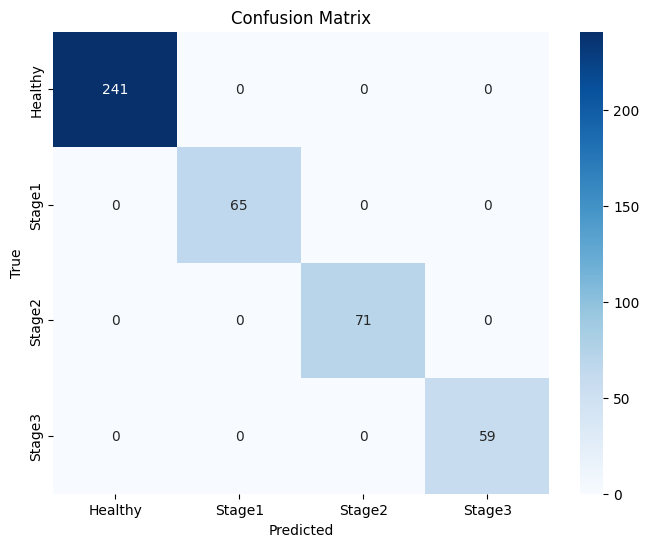


Classification Report:

              precision    recall  f1-score   support

     Healthy       1.00      1.00      1.00       241
      Stage1       1.00      1.00      1.00        65
      Stage2       1.00      1.00      1.00        71
      Stage3       1.00      1.00      1.00        59

    accuracy                           1.00       436
   macro avg       1.00      1.00      1.00       436
weighted avg       1.00      1.00      1.00       436



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report



Y_pred = model.predict(test_generator)
y_pred = np.argmax(Y_pred, axis=1)


y_true = test_generator.classes


class_labels = list(test_generator.class_indices.keys())

# 2. Create confusion matrix
cm = confusion_matrix(y_true, y_pred)

# 3. Plot confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_labels))

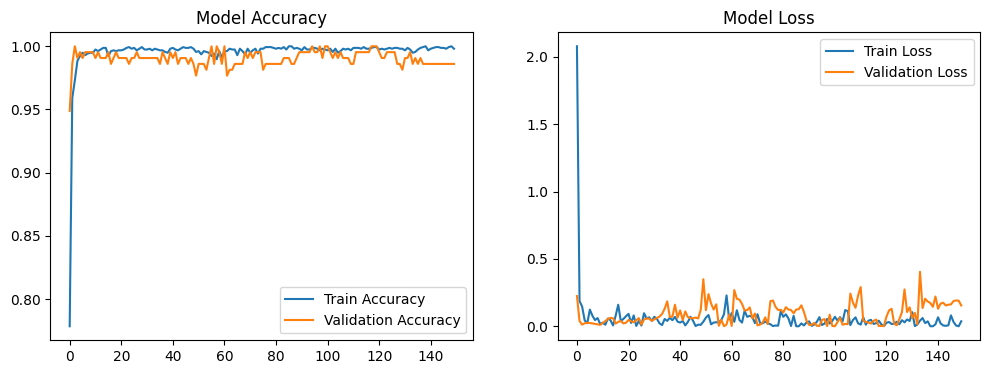

In [ ]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title("Model Accuracy")

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title("Model Loss")
plt.show()

In [ ]:
# Final Training & Validation Accuracy
final_train_acc = history.history['accuracy'][-1]
final_val_acc = history.history['val_accuracy'][-1]

print(f"Final Training Accuracy: {final_train_acc * 100:.2f}%")
print(f"Final Validation Accuracy: {final_val_acc * 100:.2f}%")

# Test Accuracy
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc * 100:.2f}%")

Final Training Accuracy: 99.81%
Final Validation Accuracy: 98.60%
14/14 ━━━━━━━━━━━━━━━━━━━━ 6s 393ms/step - accuracy: 1.0000 - loss: 7.2098e-06
Test Accuracy: 100.00%


In [ ]:
!pip install tf-keras-vis --quiet

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.4 MB/s eta 0:00:00


In [ ]:
img_path = '/content/drive/MyDrive/Final_Data_test_150/test/Stage2/wsphase2-109.jpeg'  # Change path accordingly

img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = img_array / 255.0  # Normalize
img_input = np.expand_dims(img_array, axis=0)

In [ ]:
score = CategoricalScore([np.argmax(model.predict(img_input))])
modifier = ReplaceToLinear()

gradcam = GradcamPlusPlus(model,
                          model_modifier=modifier,
                          clone=True)
cam = gradcam(score,
              img_input,
              penultimate_layer=-1)  # -1 means the last conv layer

# Postprocess
heatmap = cam[0]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


In [ ]:
from PIL import Image
import cv2

def overlay_heatmap(img_array, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    # Convert heatmap to 0-255
    heatmap = np.uint8(255 * heatmap)

    # Apply colormap (e.g., JET)
    heatmap_color = cv2.applyColorMap(heatmap, colormap)

    # Resize heatmap to image size
    heatmap_color = cv2.resize(heatmap_color, (img_array.shape[1], img_array.shape[0]))

    # Convert original image to uint8
    original_image = np.uint8(255 * img_array)

    # Overlay heatmap on original image
    overlayed = cv2.addWeighted(original_image, 1 - alpha, heatmap_color, alpha, 0)

    return overlayed


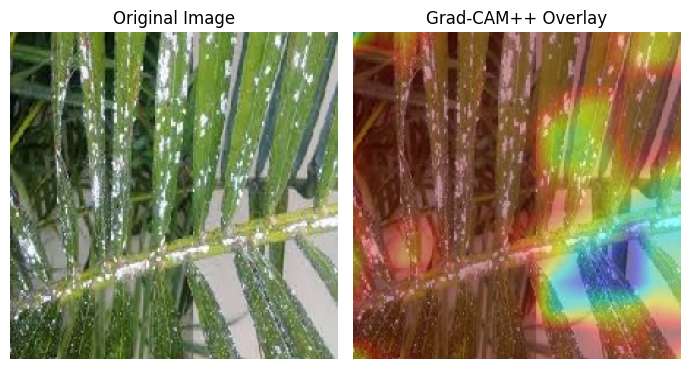

In [ ]:
overlayed_image = overlay_heatmap(img_array, heatmap)

plt.figure(figsize=(7, 5))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(img_array)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Grad-CAM++ Overlay")
plt.imshow(overlayed_image)
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=34162051a44d6899a8ce01226075f016b43a4cdfa66efc8477bf77c795bb02d4
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

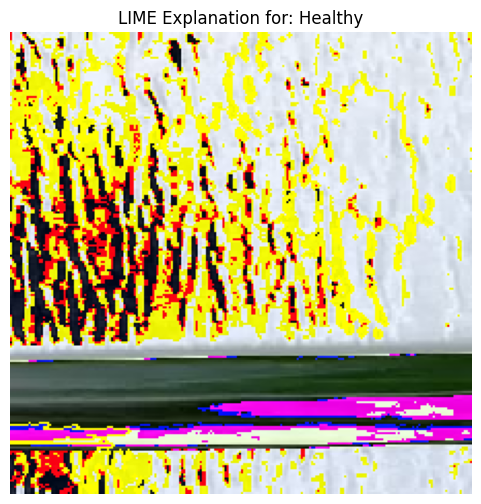

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from lime import lime_image
from skimage.segmentation import mark_boundaries
import os

# Your model (make sure it's loaded)
# model = load_model('path_to_your_model.h5')

# Define class labels and image directory
class_names = ['Healthy', 'Stage1', 'Stage2', 'Stage3']
base_test_dir = '/content/drive/MyDrive/Final_Data_test_150/test/'
img_size = (224, 224)

# Preprocessing function for LIME
def preprocess_image(img_path):
    img = load_img(img_path, target_size=img_size)
    img_array = img_to_array(img)
    img_batch = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_batch), img_array.astype('uint8')

# Prediction function for LIME
def predict_fn(images):
    images = np.array([preprocess_input(img) for img in images])
    return model.predict(images)

# Loop through one image from each class
for class_name in class_names:
    folder_path = os.path.join(base_test_dir, class_name)
    img_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

    if not img_files:
        continue

    img_path = os.path.join(folder_path, img_files[0])
    preprocessed_img, original_img = preprocess_image(img_path)

    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(original_img,
                                             predict_fn,
                                             top_labels=4,
                                             hide_color=0,
                                             num_samples=1000)

    # Get explanation for the top predicted class
    temp, mask = explanation.get_image_and_mask(
        label=explanation.top_labels[0],
        positive_only=True,
        num_features=5,
        hide_rest=False
    )

    # Plot the result
    plt.figure(figsize=(6, 6))
    plt.title(f'LIME Explanation for: {class_name}')
    plt.imshow(mark_boundaries(temp, mask))
    plt.axis('off')
    plt.show()


In [ ]:
from tensorflow.keras.models import load_model

model_path = '/content/drive/MyDrive/Saved Models/palm_saved_150_test.h5'  # Update if needed
model = load_model(model_path)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap and overlay it on the image."""
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data-test_150/test/Stage1/wsphase1-484.jpg"
overlay_gradcam(image_path, model)

error: OpenCV(4.11.0) /io/opencv/modules/imgproc/src/resize.cpp:4208: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


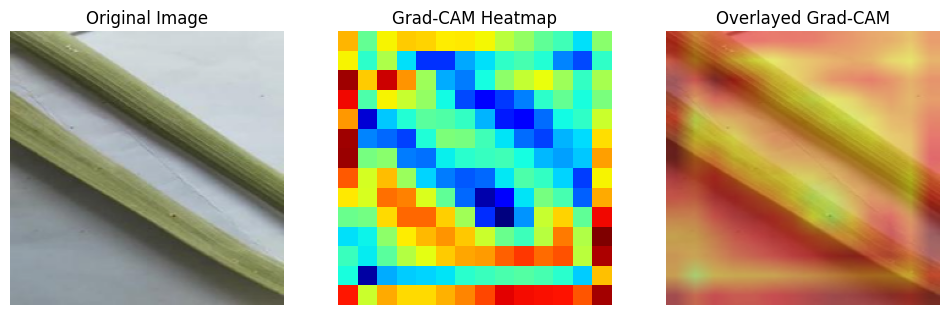

In [ ]:
# prompt: Can u generate the GRAD-CAM heatmap, and Overlayed GRAD CAM along with an original input image

# Install tf-keras-vis and lime if not already installed
!pip install tf-keras-vis --quiet
!pip install lime --quiet

# Imports needed for GRAD-CAM and LIME
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing import image
import cv2
from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Load the model
# model_path = '/content/drive/MyDrive/Saved Models/palm_saved_150_test.h5'  # Update if needed
# model = load_model(model_path)

# --- GRAD-CAM Implementation ---

def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap."""
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

def overlay_heatmap(img_array, heatmap, alpha=0.4, colormap=cv2.COLORMAP_JET):
    """Overlay heatmap on the original image."""
    # Convert heatmap to 0-255
    heatmap = np.uint8(255 * heatmap)

    # Apply colormap (e.g., JET)
    heatmap_color = cv2.applyColorMap(heatmap, colormap)

    # Resize heatmap to image size
    heatmap_color = cv2.resize(heatmap_color, (img_array.shape[1], img_array.shape[0]))

    # Convert original image to uint8
    original_image = np.uint8(255 * img_array)

    # Overlay heatmap on original image
    overlayed = cv2.addWeighted(original_image, 1 - alpha, heatmap_color, alpha, 0)

    return overlayed


def display_gradcam_results(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and display results."""
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0  # Normalize

    heatmap = grad_cam(model, img, layer_name)
    overlayed_image = overlay_heatmap(img, heatmap, alpha)

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(np.uint8(255 * img), cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    # Display heatmap correctly (grayscale)
    plt.imshow(heatmap, cmap='jet')
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()

# Example usage of the new function
image_path_gradcam = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-484.jpg" # Example path
display_gradcam_results(image_path_gradcam, model)


# --- LIME Implementation --- (already present and working in your original code)
# Define class labels and image directory
# class_names = ['Healthy', 'Stage1', 'Stage2', 'Stage3']
# base_test_dir = '/content/drive/MyDrive/Final_Data_test_150/test/'
# img_size = (224, 224)

# # Preprocessing function for LIME
# def preprocess_image_lime(img_path):
#     img = load_img(img_path, target_size=img_size)
#     img_array = img_to_array(img)
#     return img_array.astype('uint8') # Return original uint8 image for LIME

# # Prediction function for LIME
# def predict_fn_lime(images):
#     # LIME sends images as numpy arrays, we need to preprocess them like our model expects
#     processed_images = np.array([preprocess_input(img.astype('float32')) for img in images])
#     return model.predict(processed_images)


# # Loop through one image from each class for LIME explanation
# print("\n--- LIME Explanations ---")
# for class_name in class_names:
#     folder_path = os.path.join(base_test_dir, class_name)
#     img_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg') or f.endswith('.png')]

#     if not img_files:
#         print(f"No image files found in {folder_path}")
#         continue

#     img_path_lime = os.path.join(folder_path, img_files[0]) # Take the first image
#     original_img_lime = preprocess_image_lime(img_path_lime)

#     explainer = lime_image.LimeImageExplainer()
#     explanation = explainer.explain_instance(original_img_lime,
#                                              predict_fn_lime,
#                                              top_labels=4,
#                                              hide_color=0,
#                                              num_samples=1000)

#     # Get explanation for the top predicted class
#     temp, mask = explanation.get_image_and_mask(
#         label=explanation.top_labels[0], # Explain the predicted class
#         positive_only=True,
#         num_features=5,
#         hide_rest=False # Show the rest of the image faded
#     )

    # Plot the result
    # plt.figure(figsize=(6, 6))
    # # Find the predicted label name
    # predicted_label_index = explanation.top_labels[0]
    # predicted_label_name = list(test_generator.class_indices.keys())[list(test_generator.class_indices.values()).index(predicted_label_index)]

    # # plt.title(f'LIME Explanation for: {predicted_label_name} (True: {class_name})')
    # plt.imshow(mark_boundaries(temp / 255.0, mask)) # Normalize temp for imshow
    # plt.axis('off')
    # plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


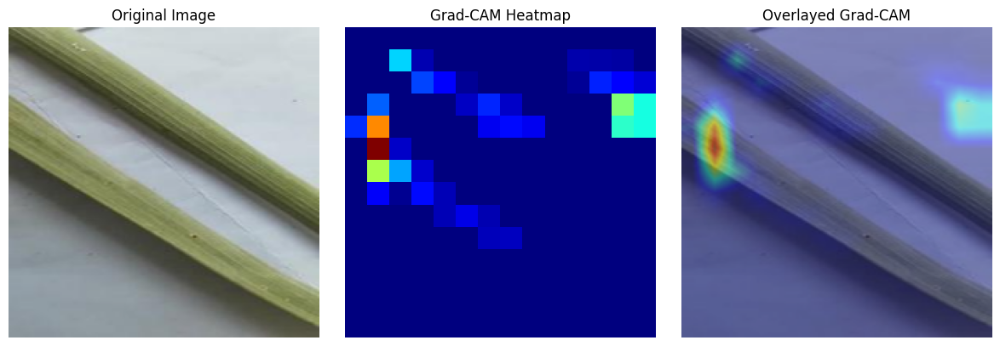

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2

# Load image
img_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-484.jpg"  # Your uploaded image
img = image.load_img(img_path, target_size=(224, 224))  # Resize if needed
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = tf.keras.applications.vgg16.preprocess_input(img_array)  # Adjust based on your model

# Load your model here
# model = load_model('/path/to/your/model.h5')

# Predict and get the class index
preds = model.predict(img_array)
predicted_class = np.argmax(preds[0])

# Grad-CAM utility
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Specify the name of the last convolutional layer
last_conv_layer_name = 'block5_conv3'  # Change as per your model

# Generate heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Load original image again for overlay
img = cv2.imread(img_path)
img = cv2.resize(img, (224, 224))
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
overlayed_img = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

# Convert BGR to RGB for displaying with matplotlib
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
overlayed_rgb = cv2.cvtColor(overlayed_img, cv2.COLOR_BGR2RGB)

# Plot all images
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(img_rgb)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Grad-CAM Heatmap')
plt.imshow(heatmap, cmap='jet')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Overlayed Grad-CAM')
plt.imshow(overlayed_rgb)
plt.axis('off')

plt.tight_layout()
plt.show()


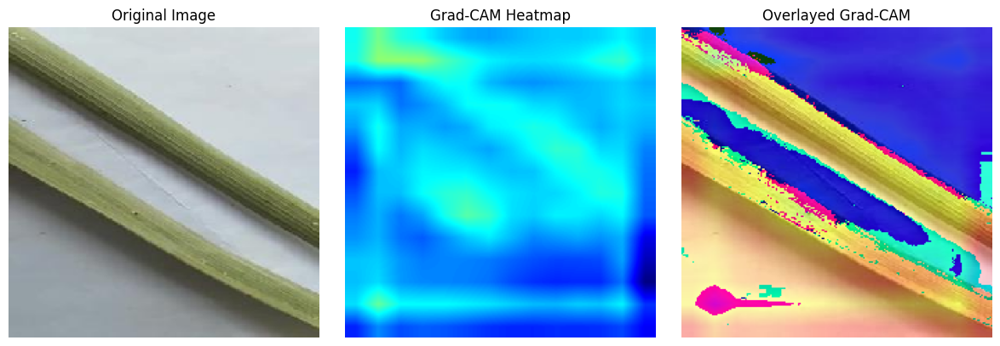

In [ ]:
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load your image
img_path = "/content/drive/MyDrive/Final_Data2/test/Stage1/wsphase1-473.jpg"
img = load_img(img_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0  # normalize

# Define the model and last conv layer
last_conv_layer_name = 'block5_conv3'  # for VGG16-like models
grad_model = Model(
    inputs=[model.inputs],
    outputs=[model.get_layer(last_conv_layer_name).output, model.output]
)

# Get the gradient of the class with respect to the output feature map
with tf.GradientTape() as tape:
    conv_outputs, predictions = grad_model(img_array)
    class_index = tf.argmax(predictions[0])
    loss = predictions[:, class_index]

grads = tape.gradient(loss, conv_outputs)
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

# Multiply the gradients with the conv output
conv_outputs = conv_outputs[0]
heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)

# Normalize between 0-1
heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

# Convert to NumPy and resize to original size
heatmap = heatmap.numpy()
heatmap = cv2.resize(heatmap, (img.size[0], img.size[1]))

# Apply COLORMAP_JET to convert to red-yellow-blue heatmap
heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)

# Superimpose heatmap on original image
superimposed_img = heatmap_colored * 0.4 + cv2.cvtColor(np.uint8(img_to_array(img)), cv2.COLOR_RGB2BGR)

# Plot
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(heatmap_colored)
plt.title('Grad-CAM Heatmap')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(np.uint8(superimposed_img), cv2.COLOR_BGR2RGB))
plt.title('Overlayed Grad-CAM')
plt.axis('off')

plt.tight_layout()
plt.show()


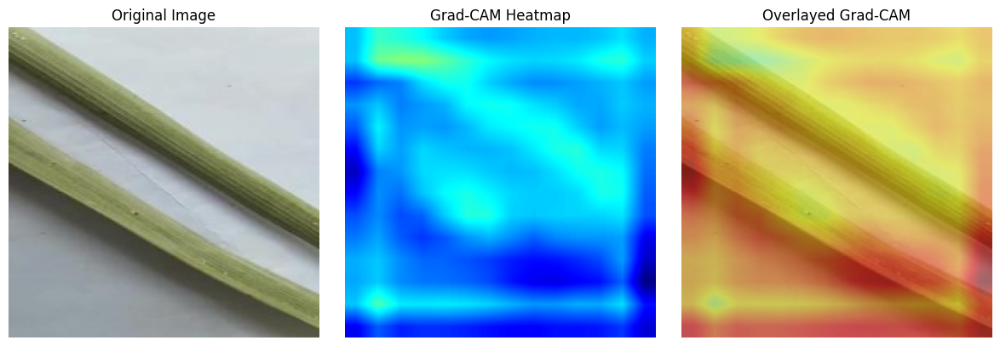

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

def grad_cam(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)

    return heatmap


def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_norm = img_rgb / 255.0

    heatmap = grad_cam(model, img_norm, layer_name)
    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.title("Grad-CAM Heatmap")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title("Overlayed Grad-CAM")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
image_path = "/content/drive/MyDrive/Final_Data2/test/Stage1/wsphase1-473.jpg"
overlay_gradcam(image_path, model, layer_name="block5_conv3")


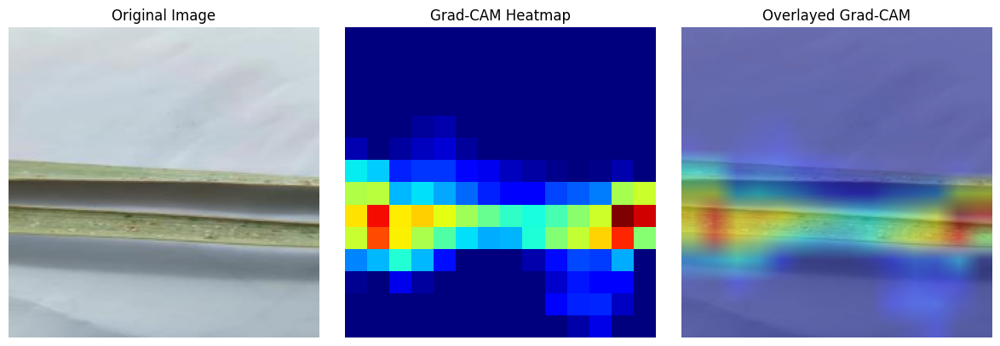

In [ ]:
# prompt: use XAI to generate Grad Cam from an input image

# Ensure necessary libraries are imported
from tensorflow.keras.preprocessing import image
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import cv2

# --- GRAD-CAM Implementation ---

def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap."""
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        # Add batch dimension to the image array
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        # Get the predicted class index
        class_idx = tf.argmax(predictions[0])
        # Get the loss with respect to the predicted class
        loss = predictions[:, class_idx]

    # Compute gradients of the predicted class with respect to the output feature map
    grads = tape.gradient(loss, conv_output)
    # Pool the gradients over all the spatial dimensions
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Multiply the pooled gradients with the output feature map
    conv_output = conv_output[0].numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i]

    # Create the heatmap
    heatmap = np.mean(conv_output, axis=-1)
    # Apply ReLU to the heatmap to only keep positive values
    heatmap = np.maximum(heatmap, 0)

    # Normalize the heatmap (optional, but recommended)
    if np.max(heatmap) != 0:
        heatmap /= np.max(heatmap)

    return heatmap

def overlay_heatmap(img_array, heatmap, alpha=0.5, colormap=cv2.COLORMAP_JET):
    """Overlay heatmap on the original image."""
    # Convert heatmap to 0-255
    heatmap = np.uint8(255 * heatmap)

    # Apply colormap (e.g., JET)
    heatmap_color = cv2.applyColorMap(heatmap, colormap)

    # Resize heatmap to image size
    heatmap_color = cv2.resize(heatmap_color, (img_array.shape[1], img_array.shape[0]))

    # Convert original image to uint8 if it's floating point (like from loading and normalizing)
    if img_array.dtype == np.float32:
        original_image = np.uint8(255 * img_array)
    else:
         original_image = np.uint8(img_array)


    # Overlay heatmap on original image
    overlayed = cv2.addWeighted(original_image, 1 - alpha, heatmap_color, alpha, 0)

    return overlayed


def display_gradcam_results(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and display results."""
    img = cv2.imread(image_path)
    # Resize the image to the expected input size of the model
    img = cv2.resize(img, (224, 224))
    # Convert BGR to RGB for processing with the model if needed, or keep BGR if your model expects it
    # Most models trained on ImageNet expect RGB or BGR based on their preprocessing
    # Assuming your VGG16 model expects BGR (as preprocess_input might handle this)
    img_processed = img.astype(np.float32) # Convert to float32 for normalization/preprocessing
    # Apply model-specific preprocessing
    # If your model uses preprocess_input from tensorflow.keras.applications.vgg16
    img_processed = tf.keras.applications.vgg16.preprocess_input(np.expand_dims(img_processed, axis=0))[0]


    # Generate the heatmap
    heatmap = grad_cam(model, img_processed, layer_name) # Pass the preprocessed image

    # Overlay the heatmap on the original image (resized to model input size)
    # We use the original image (BGR uint8) that was resized for overlaying
    overlayed_image = overlay_heatmap(img, heatmap, alpha)

    # Display the results
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) # Convert to RGB for display
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet') # Display heatmap in color
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB)) # Convert to RGB for display
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.tight_layout()
    plt.show()

# Example usage with an input image path
# Make sure you have a model loaded, for example:
# model_path = '/content/drive/MyDrive/Saved Models/palm_saved_150_test.h5'
# model = load_model(model_path) # Ensure your model is loaded


image_path_input = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-454.jpg" # Specify your input image path here

# Call the function to display Grad-CAM results for the input image
display_gradcam_results(image_path_input, model, layer_name="block5_conv3") # Adjust layer_name if needed


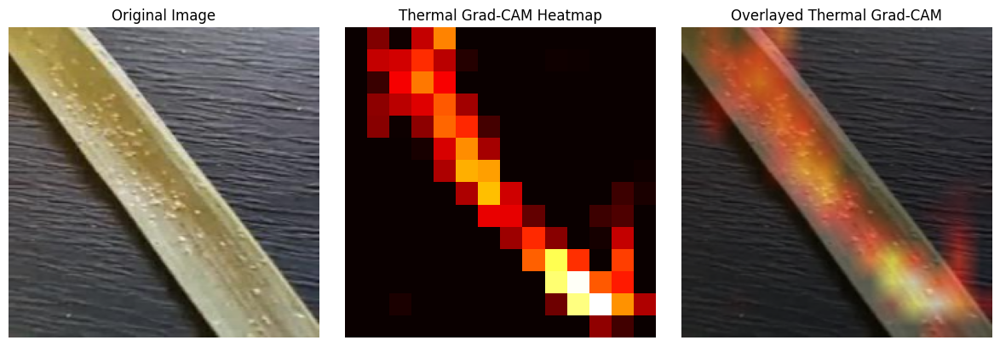

In [ ]:
# prompt: I want the thermal grad-cam heatmap

def display_thermal_gradcam_results(image_path, model, layer_name="block5_conv3", alpha=0.5, colormap=cv2.COLORMAP_HOT):
    """Load image, apply Grad-CAM with a thermal colormap, and display results."""
    img = cv2.imread(image_path)
    # Resize the image to the expected input size of the model
    img = cv2.resize(img, (224, 224))
    # Convert BGR to RGB for processing with the model if needed, or keep BGR if your model expects it
    # Most models trained on ImageNet expect RGB or BGR based on their preprocessing
    # Assuming your VGG16 model expects BGR (as preprocess_input might handle this)
    img_processed = img.astype(np.float32) # Convert to float32 for normalization/preprocessing
    # Apply model-specific preprocessing
    # If your model uses preprocess_input from tensorflow.keras.applications.vgg16
    img_processed = tf.keras.applications.vgg16.preprocess_input(np.expand_dims(img_processed, axis=0))[0]


    # Generate the heatmap
    heatmap = grad_cam(model, img_processed, layer_name) # Pass the preprocessed image

    # Overlay the heatmap on the original image (resized to model input size)
    # We use the original image (BGR uint8) that was resized for overlaying
    overlayed_image = overlay_heatmap(img, heatmap, alpha, colormap=colormap)

    # Display the results
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) # Convert to RGB for display
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='hot') # Display heatmap with 'hot' colormap
    plt.axis('off')
    plt.title("Thermal Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlayed_image, cv2.COLOR_BGR2RGB)) # Convert to RGB for display
    plt.axis('off')
    plt.title("Overlayed Thermal Grad-CAM")

    plt.tight_layout()
    plt.show()

# Example usage with an input image path, using the thermal function
image_path_input = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-351.jpg" # Specify your input image path here

# Call the function to display Thermal Grad-CAM results for the input image
display_thermal_gradcam_results(image_path_input, model, layer_name="block5_conv3") # Adjust layer_name if needed


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap and overlay it on the image."""
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

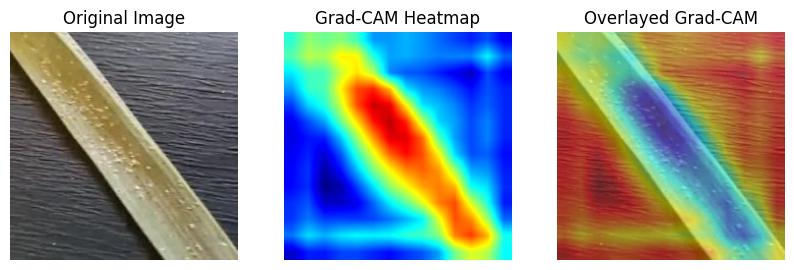

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-351.jpg"
overlay_gradcam(image_path, model)

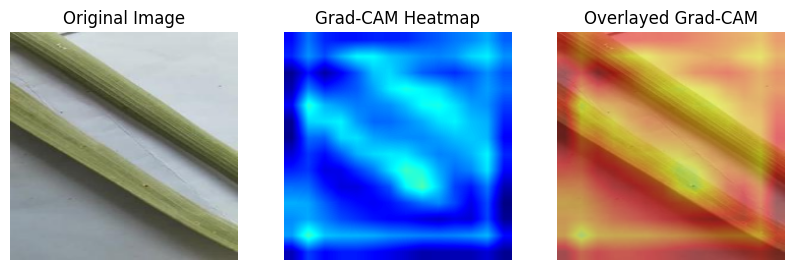

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-351.jpg"
overlay_gradcam(image_path, model)

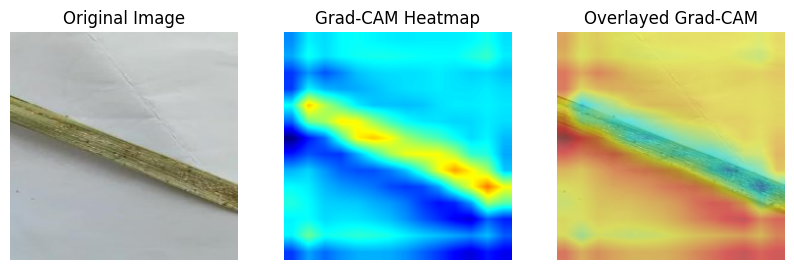

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage2/wsphase2-405.jpg"
overlay_gradcam(image_path, model)

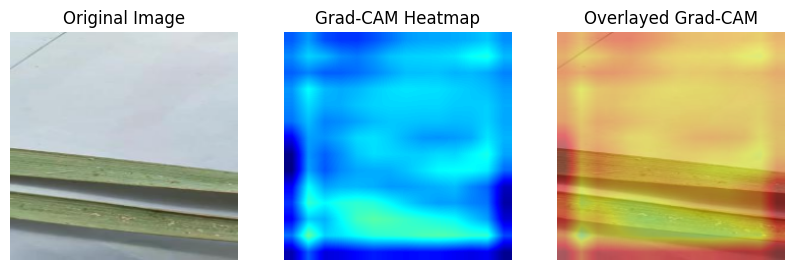

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap)
    plt.axis('off')
    plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-455.jpg"
overlay_gradcam(image_path, model)

In [ ]:
from tensorflow.keras.models import load_model

model_path = '/content/drive/MyDrive/Saved Models/palm_saved_150_test.h5'  # Update if needed
model = load_model(model_path)

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

def grad_cam_plus_plus(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_outputs, predictions = grad_model(np.expand_dims(img_array, axis=0))
                class_idx = tf.argmax(predictions[0])
                loss = predictions[:, class_idx]

            grads = tape3.gradient(loss, conv_outputs)
        first_derivative = tape2.gradient(loss, conv_outputs)
    second_derivative = tape1.gradient(first_derivative, conv_outputs)

    conv_outputs = conv_outputs[0]
    grads = grads[0]
    second_derivative = second_derivative[0]

    # Compute alpha values
    alpha_num = second_derivative
    alpha_denom = 2.0 * second_derivative + tf.reduce_sum(conv_outputs * grads, axis=(0, 1), keepdims=True)
    alpha_denom = tf.where(alpha_denom != 0.0, alpha_denom, tf.ones_like(alpha_denom))
    alphas = alpha_num / alpha_denom

    # Weigh the gradients
    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0, 1))

    # Generate the Grad-CAM++ heatmap
    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap /= tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def overlay_gradcam_pp(image_path, model, layer_name="block5_conv3", alpha=0.5):
    # Load and preprocess image
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    heatmap = grad_cam_plus_plus(model, img_array, layer_name)

    # Create color heatmap
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Overlay on image
    overlay = cv2.addWeighted(img, 1 - alpha, heatmap_color, alpha, 0)

    # Plot
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.axis('off')
    plt.title("Grad-CAM++ Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM++")

    plt.show()


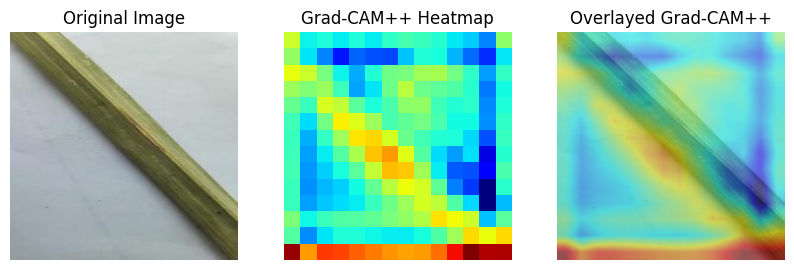

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-421.jpg"
overlay_gradcam_pp(image_path, model)

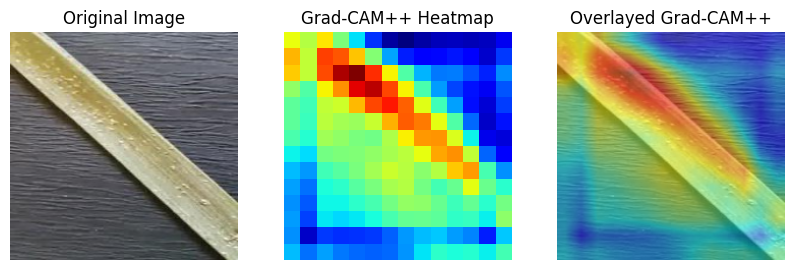

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam_pp(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

def grad_cam_plus_plus(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_outputs, predictions = grad_model(np.expand_dims(img_array, axis=0))
                class_idx = tf.argmax(predictions[0])
                loss = predictions[:, class_idx]

            grads = tape3.gradient(loss, conv_outputs)
        first_derivative = tape2.gradient(loss, conv_outputs)
    second_derivative = tape1.gradient(first_derivative, conv_outputs)

    conv_outputs = conv_outputs[0]
    grads = grads[0]
    second_derivative = second_derivative[0]

    alpha_num = second_derivative
    alpha_denom = 2.0 * second_derivative + tf.reduce_sum(conv_outputs * grads, axis=(0, 1), keepdims=True)
    alpha_denom = tf.where(alpha_denom != 0.0, alpha_denom, tf.ones_like(alpha_denom))
    alphas = alpha_num / alpha_denom

    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0, 1))

    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap /= tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def overlay_gradcam_pp(image_path, model, layer_name="block5_conv3", alpha=0.5):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    heatmap = grad_cam_plus_plus(model, img_array, layer_name)
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img, 1 - alpha, heatmap_color, alpha, 0)

    # Show only the overlayed Grad-CAM++
    plt.figure(figsize=(5, 5))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Grad-CAM++ Overlay")
    plt.show()


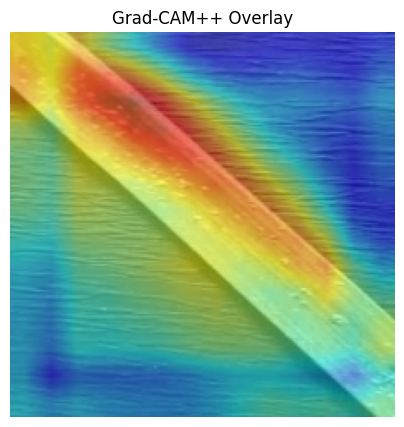

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam_pp(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

def grad_cam_plus_plus(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape1:
        with tf.GradientTape() as tape2:
            with tf.GradientTape() as tape3:
                conv_outputs, predictions = grad_model(np.expand_dims(img_array, axis=0))
                class_idx = tf.argmax(predictions[0])
                loss = predictions[:, class_idx]

            grads = tape3.gradient(loss, conv_outputs)
        first_derivative = tape2.gradient(loss, conv_outputs)
    second_derivative = tape1.gradient(first_derivative, conv_outputs)

    conv_outputs = conv_outputs[0]
    grads = grads[0]
    second_derivative = second_derivative[0]

    alpha_num = second_derivative
    alpha_denom = 2.0 * second_derivative + tf.reduce_sum(conv_outputs * grads, axis=(0, 1), keepdims=True)
    alpha_denom = tf.where(alpha_denom != 0.0, alpha_denom, tf.ones_like(alpha_denom))
    alphas = alpha_num / alpha_denom

    weights = tf.reduce_sum(alphas * tf.nn.relu(grads), axis=(0, 1))

    heatmap = tf.reduce_sum(weights * conv_outputs, axis=-1)
    heatmap = tf.maximum(heatmap, 0)
    heatmap /= tf.math.reduce_max(heatmap)
    return heatmap.numpy()


def show_gradcam_pp(image_path, model, layer_name="block5_conv3", alpha=0.5):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    heatmap = grad_cam_plus_plus(model, img_array, layer_name)
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    overlay = cv2.addWeighted(img, 1 - alpha, heatmap_color, alpha, 0)

    # Display both Original and Overlayed image
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Grad-CAM++ Overlay")

    plt.tight_layout()
    plt.show()


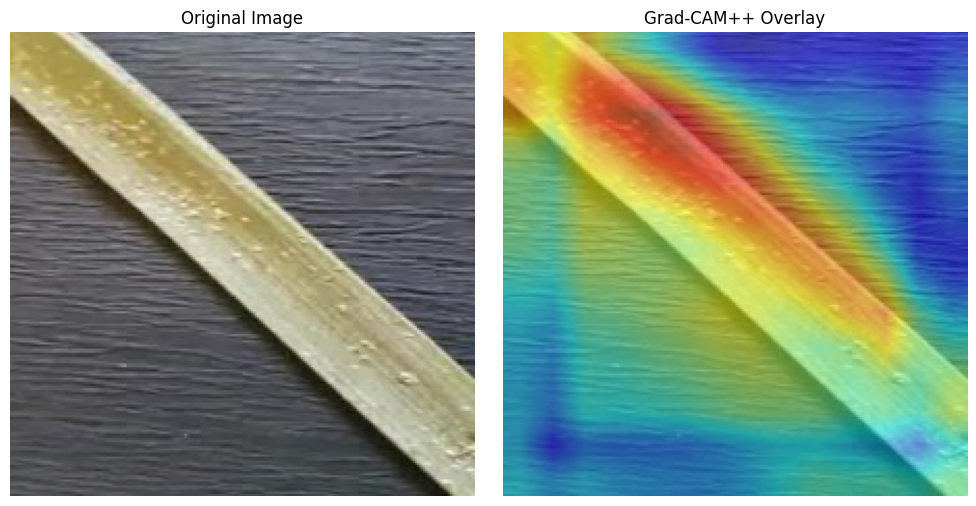

In [ ]:
show_gradcam_pp("/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg", model)


In [ ]:
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt

def grad_cam(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap


def show_gradcam_overlay(image_path, model, layer_name="block5_conv3", alpha=0.5):
    # Load and preprocess image
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, img_array, layer_name)
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Overlay Grad-CAM heatmap on original image
    overlay = cv2.addWeighted(img, 1 - alpha, heatmap_color, alpha, 0)

    # Display
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Grad-CAM Overlay")

    plt.tight_layout()
    plt.show()


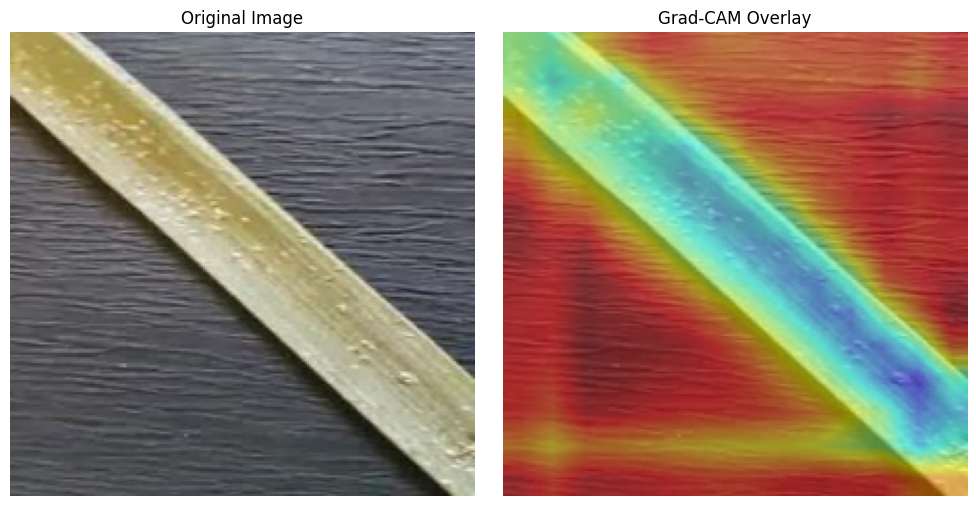

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
show_gradcam_overlay(image_path, model)


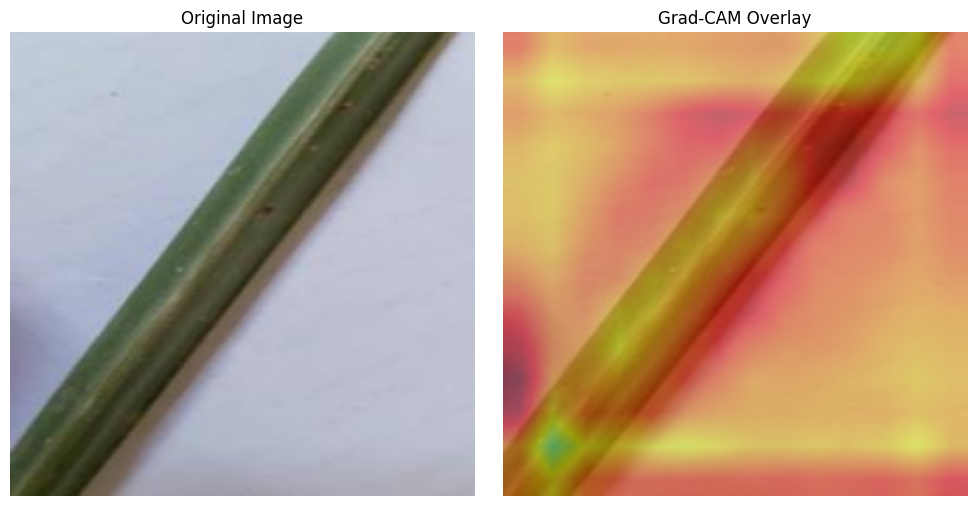

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-313.jpg"
show_gradcam_overlay(image_path, model)

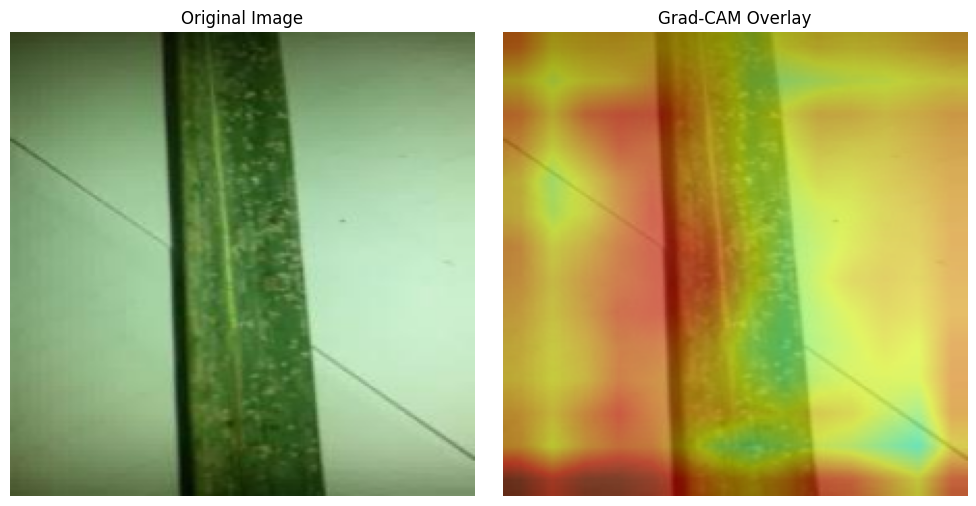

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage2/wsphase2-582.jpg"
show_gradcam_overlay(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap."""
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.expand_dims(img_array, axis=0))
        pred_index = tf.argmax(predictions[0])
        loss = predictions[:, pred_index]

    grads = tape.gradient(loss, conv_outputs)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

    conv_outputs = conv_outputs[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)

    # Normalize heatmap
    heatmap /= np.max(heatmap)

    # Optional: remove low activations to suppress red noise
    heatmap[heatmap < 0.4] = 0

    return heatmap


def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Overlay Grad-CAM heatmap on original image (only overlay and original shown)."""

    # Load and preprocess image
    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, img_array, layer_name)

    # Convert to color map
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)

    # Overlay heatmap on original image
    overlay = cv2.addWeighted(img, 1 - alpha, heatmap_colored, alpha, 0)

    # Plot
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title("Grad-CAM Overlay")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


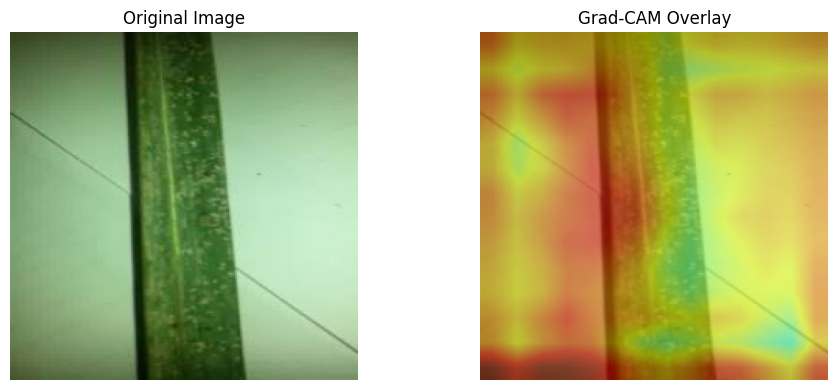

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage2/wsphase2-582.jpg"
overlay_gradcam(image_path, model)

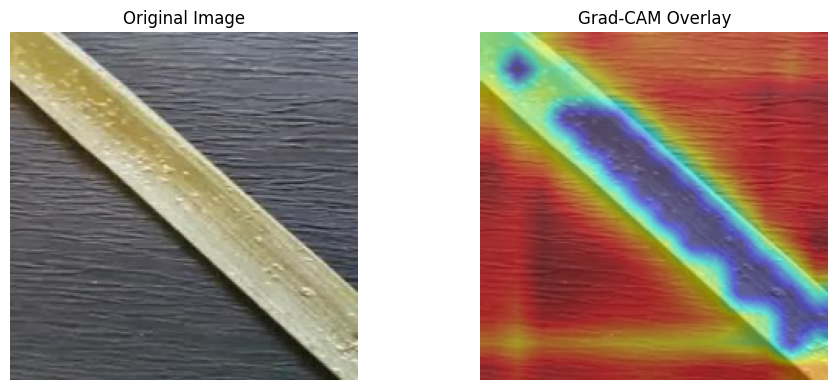

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap


def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    # Load and preprocess image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not read image at {image_path}. Please check the path.")
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    # Generate Grad-CAM heatmap
    heatmap = grad_cam(model, img_array, layer_name)
    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)

    # Use 'COLORMAP_TURBO' or 'COLORMAP_VIRIDIS' for blue background
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_VIRIDIS)

    # Overlay heatmap on original image
    overlay = cv2.addWeighted(img, 1 - alpha, heatmap_color, alpha, 0)

    # Display original and overlay
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Grad-CAM Overlay (Blue BG)")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


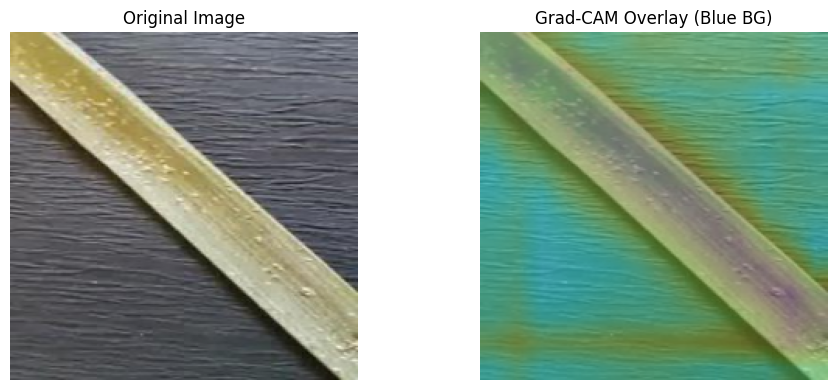

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam(image_path, model)


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap and overlay it on the image."""
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap

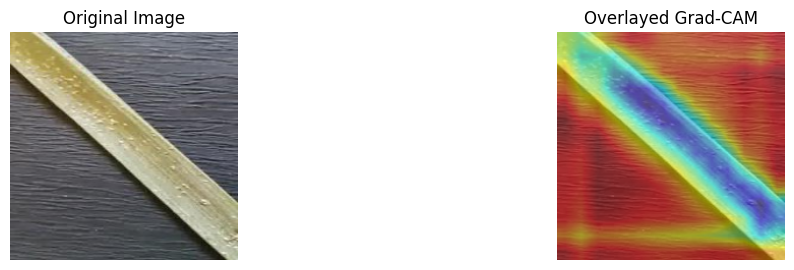

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    # plt.subplot(1, 3, 2)
    # plt.imshow(heatmap)
    # plt.axis('off')
    # plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam(image_path, model)

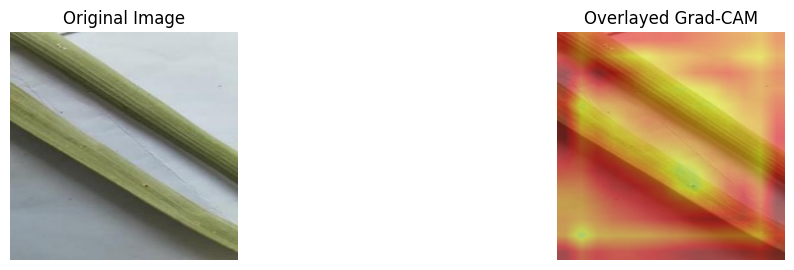

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-484.jpg"
overlay_gradcam(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


# def grad_cam(model, img_array, layer_name="block5_conv3"):
#     """Generate Grad-CAM heatmap and overlay it on the image."""
#     grad_model = tf.keras.models.Model(
#         inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
#     )

#     with tf.GradientTape() as tape:
#         conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
#         class_idx = np.argmax(predictions[0])
#         loss = predictions[:, class_idx]

#     grads = tape.gradient(loss, conv_output)
#     pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

#     conv_output = conv_output[0].numpy()

#     for i in range(pooled_grads.shape[-1]):
#         conv_output[:, :, i] *= pooled_grads[i].numpy()

#     heatmap = np.mean(conv_output, axis=-1)
#     heatmap = np.maximum(heatmap, 0)
#     heatmap /= np.max(heatmap)

#     return heatmap

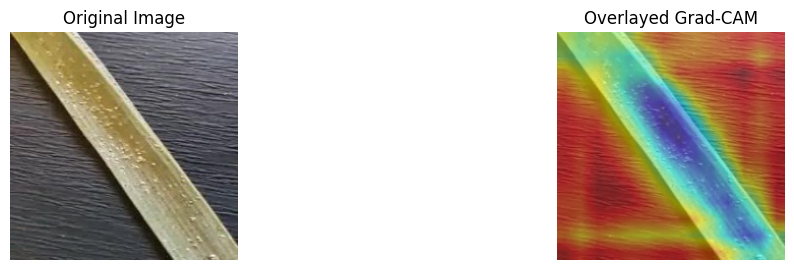

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    # plt.subplot(1, 3, 2)
    # plt.imshow(heatmap)
    # plt.axis('off')
    # plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Overlayed Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/ML/sample-image-2.jpg"
overlay_gradcam(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap


def overlay_gradcam_blue(image_path, model, layer_name="block5_conv3", alpha=0.5):
    # Load and preprocess image
    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not read image at {image_path}")
    img = cv2.resize(img, (224, 224))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_array = img_rgb / 255.0

    # Grad-CAM heatmap
    heatmap = grad_cam(model, img_array, layer_name)
    heatmap_resized = cv2.resize(heatmap, (224, 224))
    heatmap_uint8 = np.uint8(255 * heatmap_resized)

    # Apply the classic JET colormap (blue background)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    # Convert RGB image back to BGR for OpenCV overlay
    original_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)

    # Overlay heatmap on original
    overlay = cv2.addWeighted(original_bgr, 1 - alpha, heatmap_colored, alpha, 0)

    # Show original and overlay side-by-side
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title("Grad-CAM Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


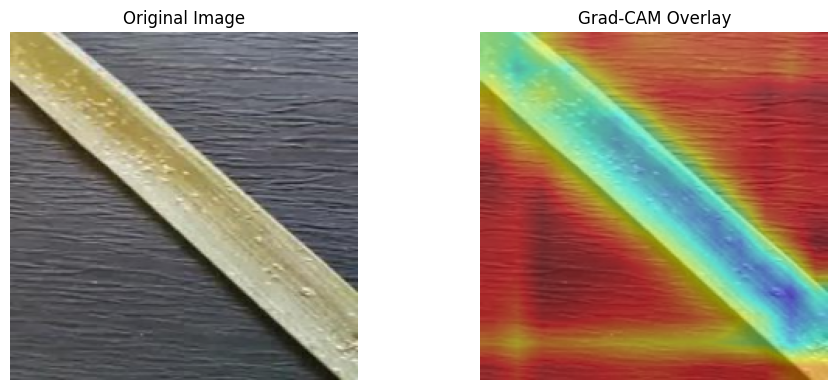

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam_blue(image_path, model)

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0].numpy()
    pooled_grads = pooled_grads.numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_outputs[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-8  # Avoid division by zero

    return heatmap


def overlay_gradcam_blue(image_path, model, layer_name="block5_conv3", alpha=0.5, threshold=0.2):
    # Load image
    original = cv2.imread(image_path)
    if original is None:
        raise FileNotFoundError(f"Image not found at {image_path}")
    original = cv2.resize(original, (224, 224))
    img_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    img_array = img_rgb.astype(np.float32) / 255.0

    # Get heatmap
    heatmap = grad_cam(model, img_array, layer_name)
    heatmap = cv2.resize(heatmap, (224, 224))

    # Apply threshold — keep only high-activation areas
    mask = heatmap > threshold
    heatmap_masked = heatmap * mask

    # Convert heatmap to 8-bit
    heatmap_uint8 = np.uint8(255 * heatmap_masked)
    heatmap_color = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)

    # Create blue background
    blue_background = np.full_like(heatmap_color, fill_value=[255, 0, 0])  # BGR = Blue

    # Composite: use heatmap_color where activation is high, blue elsewhere
    composite = np.where(mask[:, :, np.newaxis], heatmap_color, blue_background)

    # Blend with original image
    overlay = cv2.addWeighted(original, 1 - alpha, composite, alpha, 0)

    # Show
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title("Grad-CAM with Blue Background")
    plt.axis('off')
    plt.tight_layout()
    plt.show()


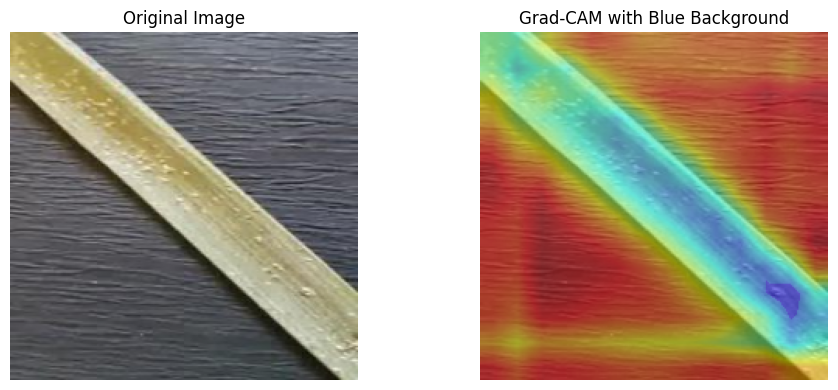

In [ ]:
image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam_blue(image_path, model)


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc1 (Dense)                     │ (None, 4096)           │   102,764,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ fc2 (Dense)                     │ (None, 4096)           │    16,781,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 1000)           │     4,097,000 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
Predicted class index: 460, class name: [[('n02894605', 'breakwater', np.float32(0.16756368))]]


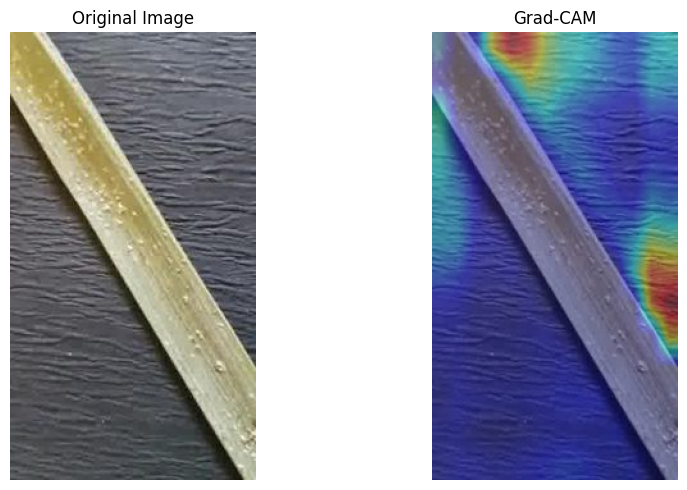

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.applications import vgg16
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2

# Load VGG16 model with pretrained weights
model = vgg16.VGG16(weights='imagenet')
model.summary()  # Optional: view layer names for debugging

# Load and preprocess image
img_path = '/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg'  # Replace with your image path
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = vgg16.preprocess_input(x)

# Get model prediction
preds = model.predict(x)
class_idx = np.argmax(preds[0])
print(f"Predicted class index: {class_idx}, class name: {vgg16.decode_predictions(preds, top=1)}")

# Get the class output and the last convolutional layer
class_output = model.output[:, int(class_idx)]
last_conv_layer = model.get_layer('block5_conv3')

# Compute gradient of the class output w.r.t. the feature map
grad_model = Model(inputs=model.input, outputs=[last_conv_layer.output, class_output])
with tf.GradientTape() as tape:
    conv_output, predictions = grad_model(x)
    grads = tape.gradient(predictions, conv_output)

# Compute weights
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
conv_output = conv_output[0]
heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_output), axis=-1)

# Normalize heatmap
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

# Resize heatmap to original image size
img_orig = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img_orig.shape[1], img_orig.shape[0]))
heatmap = np.uint8(255 * heatmap)

# Superimpose heatmap on original image
heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(img_orig, 0.6, heatmap_color, 0.4, 0)

# Save and display
cv2.imwrite('gradcam_output.jpg', superimposed_img)

# Display using matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
plt.title("Grad-CAM")
plt.axis('off')
plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Predicted class index: 460, class name: [[('n02894605', 'breakwater', np.float32(0.28779304))]]


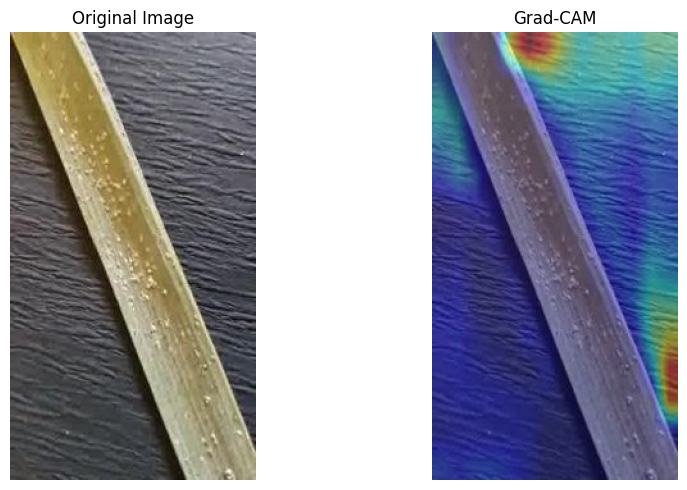

In [ ]:
# Load and preprocess image
img_path = '/content/drive/MyDrive/ML/sample-image-2.jpg'  # Replace with your image path
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = vgg16.preprocess_input(x)

# Get model prediction
preds = model.predict(x)
class_idx = np.argmax(preds[0])
print(f"Predicted class index: {class_idx}, class name: {vgg16.decode_predictions(preds, top=1)}")

# Get the class output and the last convolutional layer
class_output = model.output[:, int(class_idx)]
last_conv_layer = model.get_layer('block5_conv3')

# Compute gradient of the class output w.r.t. the feature map
grad_model = Model(inputs=model.input, outputs=[last_conv_layer.output, class_output])
with tf.GradientTape() as tape:
    conv_output, predictions = grad_model(x)
    grads = tape.gradient(predictions, conv_output)

# Compute weights
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
conv_output = conv_output[0]
heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_output), axis=-1)

# Normalize heatmap
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

# Resize heatmap to original image size
img_orig = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img_orig.shape[1], img_orig.shape[0]))
heatmap = np.uint8(255 * heatmap)

# Superimpose heatmap on original image
heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(img_orig, 0.6, heatmap_color, 0.4, 0)

# Save and display
cv2.imwrite('gradcam_output.jpg', superimposed_img)

# Display using matplotlib
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
plt.title("Grad-CAM")
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def grad_cam(model, img_array, layer_name="block5_conv3"):
    """Generate Grad-CAM heatmap and overlay it on the image."""
    grad_model = tf.keras.models.Model(
        inputs=model.input, outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(np.expand_dims(img_array, axis=0))
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0].numpy()

    for i in range(pooled_grads.shape[-1]):
        conv_output[:, :, i] *= pooled_grads[i].numpy()

    heatmap = np.mean(conv_output, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)

    return heatmap


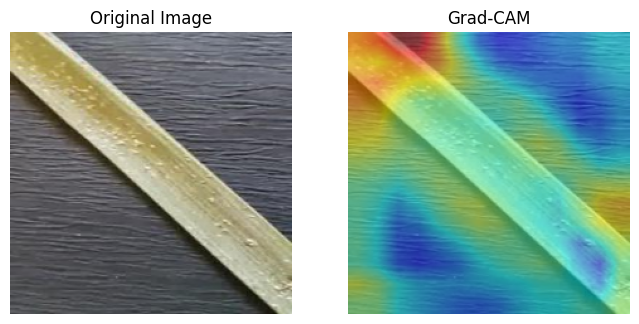

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    # plt.subplot(1, 3, 2)
    # plt.imshow(heatmap)
    # plt.axis('off')
    # plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/train/Stage1/wsphase1-364.jpg"
overlay_gradcam(image_path, model)

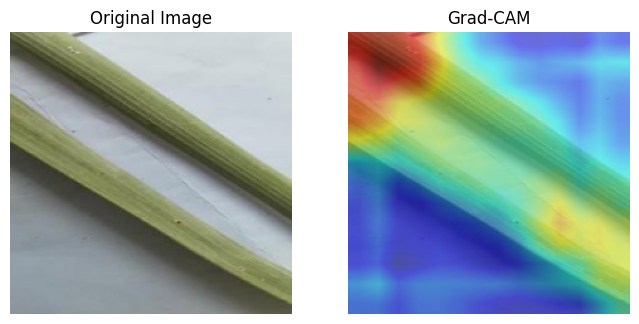

In [ ]:
def overlay_gradcam(image_path, model, layer_name="block5_conv3", alpha=0.5):
    """Load image, apply Grad-CAM, and overlay heatmap."""

    img = cv2.imread(image_path)
    img = cv2.resize(img, (224, 224))
    img = img / 255.0


    heatmap = grad_cam(model, img, layer_name)


    heatmap = cv2.resize(heatmap, (224, 224))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)


    original_img = cv2.imread(image_path)
    original_img = cv2.resize(original_img, (224, 224))


    overlay = cv2.addWeighted(original_img, 1 - alpha, heatmap, alpha, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Original Image")

    # plt.subplot(1, 3, 2)
    # plt.imshow(heatmap)
    # plt.axis('off')
    # plt.title("Grad-CAM Heatmap")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Grad-CAM")

    plt.show()


image_path = "/content/drive/MyDrive/Final_Data_test_150/test/Stage1/wsphase1-484.jpg"
overlay_gradcam(image_path, model)